https://arxiv.org/pdf/1909.13589
https://github.com/ZJULearning/MaxSquareLoss


WORKING ADAPTATION:

Double branch baseline from `outputs/split_wind_test_hurricane_matthew_baseline/2024-11-06_05-02-23/checkpoints/experiment_name-0-epoch-79-step-9600-f1-0.601407-last.ckpt`

source_events = {
    Tier1: [
        Event.hurricane_michael,
    ],
    Test: [
        Event.hurricane_michael,
    ],
    Hold: [
        Event.hurricane_michael,
    ],
    Tier3: [
        Event.tuscaloosa_tornado,
        # Event.joplin_tornado,
        Event.moore_tornado,
    ],
}

target_events = {
    # Tier1: [
    #     Event.hurricane_harvey,
    #     # Event.hurricane_florence
    # ],
    # Test: [
    #     Event.hurricane_harvey,
    #     # Event.hurricane_florence
    # ],
    # Hold: [
    #     Event.hurricane_harvey,
    #     # Event.hurricane_florence
    # ],
    Tier3: [
        Event.joplin_tornado
        #     Event.nepal_flooding
    ]
}


torch.optim.AdamW, lr=0.0000005, weight_decay=1e-7

smaller dataloader without cycle

In [1]:
from pathlib import Path
from functools import partial
import dotenv
import pytorch_lightning as pl
import torch
from matplotlib import pyplot as plt
from pytorch_lightning.callbacks import ModelCheckpoint, RichProgressBar

from inz.data.data_module import XBDDataModule
from inz.data.event import Event, Tier3, Tier1, Hold, Test
from inz.models.baseline_module import BaselineModule
from inz.util import get_loc_cls_weights, get_wandb_logger, show_masks_comparison
from inz.xview2_strong_baseline.legacy.losses import ComboLoss
from inz.xview2_strong_baseline.legacy.zoo.models import Res34_Unet_Double
from inz.models.baseline_module import BaselineModule
import torch.nn as nn
import torch.nn.functional as F

from torchmetrics.functional.classification import multiclass_f1_score, binary_f1_score
from torchmetrics.functional.classification import binary_accuracy

In [2]:
import sys  # noqa: I001

sys.path.append("inz/revgrad")

from utils import GradientReversal

sys.path.append("inz/xview2_strong_baseline")

from legacy.zoo.models import Res34_Unet_Double

In [3]:
dotenv.load_dotenv()
RANDOM_SEED = 123
pl.seed_everything(RANDOM_SEED)
device = torch.device("cuda")
torch.set_float32_matmul_precision("high")

Seed set to 123


In [4]:
# BATCH_SIZE = 16
BATCH_SIZE = 16

source_events = {
    Tier1: [
        Event.hurricane_michael,
    ],
    Test: [
        Event.hurricane_michael,
    ],
    Hold: [
        Event.hurricane_michael,
    ],
    Tier3: [
        Event.tuscaloosa_tornado,
        # Event.joplin_tornado,
        Event.moore_tornado,
    ],
}

target_events = {
    # Tier1: [
    #     Event.hurricane_harvey,
    #     # Event.hurricane_florence
    # ],
    # Test: [
    #     Event.hurricane_harvey,
    #     # Event.hurricane_florence
    # ],
    # Hold: [
    #     Event.hurricane_harvey,
    #     # Event.hurricane_florence
    # ],
    Tier3: [
        Event.joplin_tornado
        #     Event.nepal_flooding
    ]
}

dm1 = XBDDataModule(
    path=Path("data/xBD_processed_512"),
    drop_unclassified_channel=True,
    events=source_events,
    val_fraction=0.15,
    test_fraction=0.0,
    train_batch_size=BATCH_SIZE,
    val_batch_size=BATCH_SIZE,
    test_batch_size=BATCH_SIZE,
)
dm1.prepare_data()
dm1.setup("fit")
dm2 = XBDDataModule(
    path=Path("data/xBD_processed_512"),
    drop_unclassified_channel=True,
    events=target_events,
    val_fraction=0.15,
    test_fraction=0.0,
    train_batch_size=BATCH_SIZE,
    val_batch_size=BATCH_SIZE,
    test_batch_size=BATCH_SIZE,
)
dm2.prepare_data()
dm2.setup("fit")

print(f"{len(dm1.train_dataloader())} train batches, {len(dm1.val_dataloader())} val batches")

238 train batches, 42 val batches


In [5]:
CLASS_WEIGHTS = torch.Tensor([0.01, 1.0, 9.0478803, 8.68207691, 12.9632271])

In [6]:
# Baseline double branch

MODEL_CKPT = "/home/tomek/inz/inz/outputs/split_wind_test_hurricane_matthew_baseline/2024-11-06_05-02-23/checkpoints/experiment_name-0-epoch-79-step-9600-f1-0.601407-last.ckpt"
model = BaselineModule.load_from_checkpoint(
    checkpoint_path=MODEL_CKPT,
    model=Res34_Unet_Double(pretrained=True),
    loss=ComboLoss(weights={"dice": 1, "focal": 1}),
    # optimizer_factory=partial(torch.optim.AdamW, lr=0.0002, weight_decay=1e-6),
    # lr=0.000002 gives 0.02 improvement in macro F1, 0.25 for 0.0000005
    optimizer_factory=partial(torch.optim.AdamW, lr=0.0000005, weight_decay=1e-7),
    scheduler_factory=partial(
        torch.optim.lr_scheduler.MultiStepLR,
        gamma=0.5,
        milestones=[5, 11, 17, 23, 29, 33, 47, 50, 60, 70, 90, 110, 130, 150, 170, 180, 190],
    ),
    class_weights=CLASS_WEIGHTS,
).to(device)
model.class_weights = model.class_weights.to(device)


# Baseline single branch

# from inz.models.baseline_singlebranch import SingleBranchBaselinePLModule, BaselineSingleBranchModule

# MODEL_CKPT = Path('/home/tomek/inz/inz/saved_checkpoints/runs/baseline_singlebranch/baseline_singlebranch_ckpt/baseline_singlebranch-epoch=33-step=16592-challenge_score_safe=0.639932-best-challenge-score.ckpt')
# model = SingleBranchBaselinePLModule.load_from_checkpoint(
#     checkpoint_path=MODEL_CKPT,
#     model=BaselineSingleBranchModule(pretrained=True),
#     loss=ComboLoss(weights={"dice": 1, "focal": 1}),
#     # optimizer_factory=partial(torch.optim.AdamW, lr=0.0002, weight_decay=1e-6),
#     # lr=0.000002 gives 0.02 improvement in macro F1, 0.25 for 0.0000005
#     optimizer_factory=partial(torch.optim.AdamW, lr=0.0000005, weight_decay=1e-7),
#     scheduler_factory=partial(
#         torch.optim.lr_scheduler.MultiStepLR,
#         gamma=0.5,
#         milestones=[5, 11, 17, 23, 29, 33, 47, 50, 60, 70, 90, 110, 130, 150, 170, 180, 190],
#     ),
#     class_weights=CLASS_WEIGHTS,
# ).to(device)
# model.class_weights = model.class_weights.to(device)



# Farseg single branch

# from inz.models.farseg_singlebranch_module import SingleBranchFarSeg, FarSegSingleBranchModule
# import simplecv

# MODEL_CKPT = Path('/home/tomek/inz/inz/saved_checkpoints/runs/farseg_single/2024-10-25_00-48-01/checkpoints/experiment_name-0-epoch-28-step-28275-challenge_score_safe-0.6489-best-challenge-score.ckpt')
# model = FarSegSingleBranchModule.load_from_checkpoint(
#     checkpoint_path=MODEL_CKPT,
#     model=SingleBranchFarSeg(
#         n_classes=5,
#         farseg_config={
#             "resnet_encoder": {
#                 "resnet_type": "resnet50",
#                 "include_conv5": True,
#                 "batchnorm_trainable": True,
#                 "pretrained": True,
#                 "freeze_at": 0,
#                 # 8, 16 or 32
#                 "output_stride": 32,
#                 "with_cp": [False, False, False, False],
#                 "stem3_3x3": False
#             },
#             "fpn": {
#                 "in_channels_list": [256, 512, 1024, 2048],
#                 "out_channels": 256,
#                 "conv_block": simplecv.module.fpn.default_conv_block,
#                 "top_blocks": None,
#             },
#             "scene_relation": {
#                 "in_channels": 2048,
#                 "channel_list": [256, 256, 256, 256],
#                 "out_channels": 256
#             },
#             "decoder": {
#                 "in_channels": 256,
#                 "out_channels": 128,
#                 "in_feat_output_strides": [4, 8, 16, 32],
#                 "out_feat_output_stride": 4,
#                 "norm_fn": torch.nn.BatchNorm2d,
#                 "num_groups_gn": None
#             },
#             "num_classes": 5,
#             "loss": {
#                 "cls_weight": 1.0,
#                 "ignore_index": 255
#             },
#             "annealing_softmax_focalloss": {
#                 "gamma": 2.0,
#                 "max_step": 10000,
#                 "annealing_type": "cosine",
#             }
#         }
#     ),
#     optimizer_factory=partial(torch.optim.AdamW, lr=0.0000005, weight_decay=1e-7),
#     scheduler_factory=partial(
#         torch.optim.lr_scheduler.PolynomialLR,
#         power=0.9,
#         total_iters=5000,
#     ),
#     class_weights=CLASS_WEIGHTS,
# ).to(device)
# model.class_weights = model.class_weights.to(device)

using weights from ResNet34_Weights.IMAGENET1K_V1


In [7]:
optim = model.optimizer_factory(model.parameters())
scheduler = torch.optim.lr_scheduler.MultiStepLR(
    optim,
    gamma=0.5,
    milestones=[
        5,
        11,
        17,
        23,
        29,
        33,
        47,
        50,
        60,
        70,
        90,
        110,
        130,
        150,
        170,
        180,
        190,
    ],
)

https://arxiv.org/pdf/1909.13589
https://github.com/ZJULearning/MaxSquareLoss


In [8]:
class MaxSquareloss(nn.Module):
    def __init__(self, ignore_index=-1, num_class=19):
        super().__init__()
        self.ignore_index = ignore_index
        self.num_class = num_class

    def forward(self, pred, prob):
        """
        :param pred: predictions (N, C, H, W)
        :param prob: probability of pred (N, C, H, W)
        :return: maximum squares loss
        """
        # prob -= 0.5
        mask = prob != self.ignore_index
        loss = -torch.mean(torch.pow(prob, 2)[mask]) / 2
        return loss


class IW_MaxSquareloss(nn.Module):
    """

    #############################
    NO GUARANTEE THIS WORKS
    #############################

    """

    def __init__(self, ignore_index=-1, num_class=19, ratio=0.2):
        super().__init__()
        self.ignore_index = ignore_index
        self.num_class = num_class
        self.ratio = ratio

    def forward(self, pred, prob, label=None):
        """
        :param pred: predictions (N, C, H, W)
        :param prob: probability of pred (N, C, H, W)
        :param label(optional): the map for counting label numbers (N, C, H, W)
        :return: maximum squares loss with image-wise weighting factor
        """
        # prob -= 0.5
        N, C, H, W = prob.size()
        mask = prob != self.ignore_index
        maxpred, argpred = torch.max(prob, 1)
        mask_arg = maxpred != self.ignore_index
        argpred = torch.where(mask_arg, argpred, torch.ones(1).to(prob.device, dtype=torch.long) * self.ignore_index)
        if label is None:
            label = argpred
        weights = []
        batch_size = prob.size(0)
        for i in range(batch_size):
            hist = torch.histc(
                label[i].cpu().data.float(), bins=self.num_class + 1, min=-1, max=self.num_class - 1
            ).float()
            hist = hist[1:]
            weight = (
                (1 / torch.max(torch.pow(hist, self.ratio) * torch.pow(hist.sum(), 1 - self.ratio), torch.ones(1)))
                .to(argpred.device)[argpred[i]]
                .detach()
            )
            weights.append(weight)
        weights = torch.stack(weights, dim=0)
        mask = mask_arg.unsqueeze(1).expand_as(prob)
        prior = torch.mean(prob, (2, 3), True).detach()
        # loss = -torch.sum((torch.pow(prob, 2)*weights)[mask]) / (batch_size*self.num_class)
        # fix for tensor shape issue
        loss = -torch.sum((torch.pow(prob, 2) * weights.unsqueeze(dim=1))[mask]) / (batch_size * self.num_class)
        return loss

In [9]:

import gc
from tqdm.auto import tqdm
from itertools import islice, cycle

source_loader = dm1.train_dataloader()
target_loader = dm2.train_dataloader()

EPOCHS = 40
LAMBDA_TARGET = 0.2

# target_loss = MaxSquareloss(ignore_index=-1, num_class=5).to(device)
target_loss = IW_MaxSquareloss(ignore_index=-1, num_class=5, ratio=0.2).to(device)

for epoch in range(0, EPOCHS + 1):
    batches = zip(source_loader, target_loader)
    # batches = zip(source_loader, cycle(target_loader))  # assuming target_loader is smaller
    n_batches = min(len(source_loader), len(target_loader)) - 1
    # n_batches = len(source_loader) - 1

    total_source_loss = total_target_loss = total_source_f1 = total_target_f1 = total_source_challenge_score = (
        total_target_challenge_score
    ) = 0
    total_source_f1_class = torch.Tensor([0.0, 0.0, 0.0, 0.0, 0.0]).to(device)
    total_target_f1_class = torch.Tensor([0.0, 0.0, 0.0, 0.0, 0.0]).to(device)
    for step, ((source_batch), (target_batch)) in enumerate(
        tqdm(islice(batches, n_batches), total=n_batches, position=0, leave=True), start=1
    ):

        gc.collect()
        if epoch == 0:
            model.eval()
            torch.set_grad_enabled(False)
        else:
            model.train()
            torch.set_grad_enabled(True)

        s_img_pre, s_mask_pre, s_img_post, s_mask_post = source_batch

        s_img_pre = s_img_pre.to(device)
        s_mask_pre = s_mask_pre.to(device)
        s_img_post = s_img_post.to(device)
        s_mask_post = s_mask_post.to(device)

        source_preds = model(torch.cat([s_img_pre, s_img_post], dim=1))

        if epoch != 0:
            # Baseline
            loss_source = torch.stack(
                [
                    model.loss_fn(source_preds[:, i, ...], s_mask_post.to(torch.float)[:, i, ...])
                    for i in range(source_preds.shape[1])
                ]
            )
            loss_source = loss_source.dot(model.class_weights).sum()
            # FarSeg

            # loss_source = model.model.module.config.loss.cls_weight * model.model.module.cls_loss(
            #     source_preds, torch.argmax(s_mask_post, dim=1)
            # )

            loss_source.backward()
            total_source_loss += loss_source.cpu().item()

        t_img_pre, t_mask_pre, t_img_post, t_mask_post = target_batch

        t_img_pre = t_img_pre.to(device)
        t_mask_pre = t_mask_pre.to(device)
        t_img_post = t_img_post.to(device)
        t_mask_post = t_mask_post.to(device)

        target_preds = model(torch.cat([t_img_pre, t_img_post], dim=1))

        if epoch != 0:
            target_preds_P = F.softmax(target_preds, dim=1)
            target_preds_labels = target_preds_P
            loss_target = LAMBDA_TARGET * target_loss(target_preds, target_preds_labels)

            loss_target.backward()
            total_target_loss += loss_target.cpu().item()

        if epoch != 0:
            optim.step()
            optim.zero_grad()

        f1_source = multiclass_f1_score(source_preds.argmax(dim=1), s_mask_post.argmax(dim=1), num_classes=5)
        total_source_f1 += f1_source

        f1_source_class = multiclass_f1_score(
            source_preds.argmax(dim=1), s_mask_post.argmax(dim=1), num_classes=5, average="none"
        )
        total_source_f1_class += f1_source_class

        source_challenge_score = 0.3 * binary_f1_score(
            (source_preds.argmax(dim=1) > 0).to(torch.int), (s_mask_post.argmax(dim=1) > 0).to(torch.int)
        ) + 0.7 * 5 / sum(1 / v for v in f1_source_class)
        total_source_challenge_score += source_challenge_score

        with torch.no_grad():
            label_preds_target = model(torch.cat([t_img_pre, t_img_post], dim=1))
            f1_target = multiclass_f1_score(
                label_preds_target.argmax(dim=1), t_mask_post.to(device).argmax(dim=1), num_classes=5
            )
            total_target_f1 += f1_target

            f1_target_class = multiclass_f1_score(
                label_preds_target.argmax(dim=1), t_mask_post.to(device).argmax(dim=1), num_classes=5, average="none"
            )
            total_target_f1_class += f1_target_class

            target_challenge_score = 0.3 * binary_f1_score(
                (target_preds.argmax(dim=1) > 0).to(torch.int), (t_mask_post.argmax(dim=1) > 0).to(torch.int)
            ) + 0.7 * 5 / sum(1 / v for v in f1_target_class)
            total_target_challenge_score += target_challenge_score

        if epoch != 0:
            tqdm.write(
                f"STEP {(epoch-1) * BATCH_SIZE + step:03d}: source_loss={loss_source.item():.4f}, target_loss={loss_target.item():.4f}, "
                f"source_f1={f1_source:.4f}, "
                f"target_f1={f1_target:.4f}, "
                f"\nsource_f1_class={f1_source_class}"
                f"\ntarget_f1_class={f1_target_class}"
                f"\nsource_challenge_score={source_challenge_score:.4f}"
                f"\ntarget_challenge_score={target_challenge_score:.4f}"
            )


    if epoch != 0:
        scheduler.step()

    mean_source_loss = total_source_loss / n_batches
    mean_target_loss = total_target_loss / n_batches
    mean_f1_source = total_source_f1 / n_batches
    mean_f1_target = total_target_f1 / n_batches
    mean_f1_source_class = total_source_f1_class / n_batches
    mean_f1_target_class = total_target_f1_class / n_batches
    mean_source_challenge_score = total_source_challenge_score / n_batches
    mean_target_challenge_score = total_target_challenge_score / n_batches
    tqdm.write(
        f"############## EPOCH {epoch:03d}: source_loss={mean_source_loss:.4f}, target_loss={mean_target_loss:.4f}, "
        f"source_f1={mean_f1_source:.4f}, "
        f"target_f1={mean_f1_target:.4f}, "
        f"\nsource_f1_class={mean_f1_source_class}"
        f"\ntarget_f1_class={mean_f1_target_class}"
        f"\nsource_challenge_score={mean_source_challenge_score:.4f}"
        f"\ntarget_challenge_score={mean_target_challenge_score:.4f}"
    )

  0%|          | 0/31 [00:00<?, ?it/s]

############## EPOCH 000: source_loss=0.0000, target_loss=0.0000, source_f1=0.6348, target_f1=0.7572, 
source_f1_class=tensor([0.9873, 0.7073, 0.4292, 0.4236, 0.6266], device='cuda:0')
target_f1_class=tensor([0.9860, 0.7954, 0.5701, 0.5928, 0.8416], device='cuda:0')
source_challenge_score=0.6052
target_challenge_score=0.7581


  0%|          | 0/31 [00:00<?, ?it/s]

STEP 001: source_loss=20.4609, target_loss=-0.0430, source_f1=0.6197, target_f1=0.7706, 
source_f1_class=tensor([0.9884, 0.8199, 0.5352, 0.7390, 0.0158], device='cuda:0')
target_f1_class=tensor([0.9785, 0.8375, 0.6197, 0.6624, 0.7549], device='cuda:0')
source_challenge_score=0.3073
target_challenge_score=0.7795
STEP 002: source_loss=17.8013, target_loss=-0.0430, source_f1=0.6717, target_f1=0.7653, 
source_f1_class=tensor([0.9911, 0.8050, 0.6787, 0.8840, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9787, 0.7523, 0.7238, 0.6512, 0.7204], device='cuda:0')
source_challenge_score=0.2521
target_challenge_score=0.7742
STEP 003: source_loss=12.3193, target_loss=-0.0432, source_f1=0.7368, target_f1=0.8412, 
source_f1_class=tensor([0.9884, 0.8382, 0.5827, 0.5215, 0.7530], device='cuda:0')
target_f1_class=tensor([0.9801, 0.7937, 0.7663, 0.8368, 0.8292], device='cuda:0')
source_challenge_score=0.7415
target_challenge_score=0.8423
STEP 004: source_loss=14.1459, target_loss=-0.0422, source_f1

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 017: source_loss=11.5002, target_loss=-0.0428, source_f1=0.7650, target_f1=0.7912, 
source_f1_class=tensor([0.9874, 0.7924, 0.7183, 0.5667, 0.7600], device='cuda:0')
target_f1_class=tensor([0.9827, 0.8427, 0.7482, 0.5847, 0.7979], device='cuda:0')
source_challenge_score=0.7785
target_challenge_score=0.7965
STEP 018: source_loss=11.9299, target_loss=-0.0426, source_f1=0.7499, target_f1=0.7695, 
source_f1_class=tensor([0.9899, 0.8003, 0.6354, 0.6523, 0.6716], device='cuda:0')
target_f1_class=tensor([0.9830, 0.7812, 0.7446, 0.5946, 0.7439], device='cuda:0')
source_challenge_score=0.7545
target_challenge_score=0.7756
STEP 019: source_loss=7.0449, target_loss=-0.0424, source_f1=0.8436, target_f1=0.7906, 
source_f1_class=tensor([0.9903, 0.8454, 0.7307, 0.8128, 0.8389], device='cuda:0')
target_f1_class=tensor([0.9835, 0.8335, 0.6749, 0.6423, 0.8190], device='cuda:0')
source_challenge_score=0.8453
target_challenge_score=0.7939
STEP 020: source_loss=13.4283, target_loss=-0.0424, source_f1=

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 033: source_loss=23.4083, target_loss=-0.0422, source_f1=0.5389, target_f1=0.7467, 
source_f1_class=tensor([0.9908, 0.7818, 0.3844, 0.5376, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9850, 0.8137, 0.7064, 0.4622, 0.7662], device='cuda:0')
source_challenge_score=0.2308
target_challenge_score=0.7372
STEP 034: source_loss=8.4081, target_loss=-0.0427, source_f1=0.8122, target_f1=0.7956, 
source_f1_class=tensor([0.9901, 0.7733, 0.7066, 0.8223, 0.7690], device='cuda:0')
target_f1_class=tensor([0.9814, 0.7834, 0.6945, 0.7546, 0.7642], device='cuda:0')
source_challenge_score=0.8087
target_challenge_score=0.7989
STEP 035: source_loss=6.6401, target_loss=-0.0423, source_f1=0.8384, target_f1=0.5306, 
source_f1_class=tensor([0.9901, 0.8433, 0.7400, 0.6834, 0.9351], device='cuda:0')
target_f1_class=tensor([0.9878, 0.8110, 0.6389, 0.1842, 0.0311], device='cuda:0')
source_challenge_score=0.8333
target_challenge_score=0.3468
STEP 036: source_loss=8.7976, target_loss=-0.0426, source_f1=0.

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 049: source_loss=11.7066, target_loss=-0.0428, source_f1=0.7807, target_f1=0.7350, 
source_f1_class=tensor([0.9923, 0.8771, 0.7621, 0.9119, 0.3601], device='cuda:0')
target_f1_class=tensor([0.9818, 0.7879, 0.6638, 0.5289, 0.7128], device='cuda:0')
source_challenge_score=0.7457
target_challenge_score=0.7458
STEP 050: source_loss=7.4939, target_loss=-0.0427, source_f1=0.8376, target_f1=0.7538, 
source_f1_class=tensor([0.9909, 0.8759, 0.7469, 0.7495, 0.8248], device='cuda:0')
target_f1_class=tensor([0.9829, 0.8389, 0.7042, 0.4564, 0.7868], device='cuda:0')
source_challenge_score=0.8434
target_challenge_score=0.7502
STEP 051: source_loss=9.4554, target_loss=-0.0425, source_f1=0.7789, target_f1=0.7756, 
source_f1_class=tensor([0.9847, 0.8025, 0.5050, 0.6894, 0.9128], device='cuda:0')
target_f1_class=tensor([0.9834, 0.8503, 0.7651, 0.4641, 0.8152], device='cuda:0')
source_challenge_score=0.7678
target_challenge_score=0.7672
STEP 052: source_loss=23.5508, target_loss=-0.0432, source_f1=0

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 065: source_loss=10.9524, target_loss=-0.0430, source_f1=0.7504, target_f1=0.7768, 
source_f1_class=tensor([0.9919, 0.7158, 0.7409, 0.6458, 0.6578], device='cuda:0')
target_f1_class=tensor([0.9777, 0.8075, 0.7309, 0.5723, 0.7956], device='cuda:0')
source_challenge_score=0.7763
target_challenge_score=0.7780
STEP 066: source_loss=11.4451, target_loss=-0.0427, source_f1=0.7816, target_f1=0.7692, 
source_f1_class=tensor([0.9924, 0.8637, 0.7074, 0.8843, 0.4600], device='cuda:0')
target_f1_class=tensor([0.9811, 0.8281, 0.7842, 0.4874, 0.7652], device='cuda:0')
source_challenge_score=0.7749
target_challenge_score=0.7636
STEP 067: source_loss=9.5856, target_loss=-0.0428, source_f1=0.7913, target_f1=0.8018, 
source_f1_class=tensor([0.9880, 0.8292, 0.6870, 0.6576, 0.7947], device='cuda:0')
target_f1_class=tensor([0.9797, 0.8533, 0.7041, 0.6906, 0.7814], device='cuda:0')
source_challenge_score=0.7971
target_challenge_score=0.8063
STEP 068: source_loss=16.7071, target_loss=-0.0421, source_f1=

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 081: source_loss=7.6880, target_loss=-0.0426, source_f1=0.8236, target_f1=0.7035, 
source_f1_class=tensor([0.9861, 0.7818, 0.7152, 0.8110, 0.8237], device='cuda:0')
target_f1_class=tensor([0.9853, 0.7939, 0.5693, 0.4582, 0.7109], device='cuda:0')
source_challenge_score=0.8213
target_challenge_score=0.7173
STEP 082: source_loss=12.1714, target_loss=-0.0423, source_f1=0.7458, target_f1=0.7456, 
source_f1_class=tensor([0.9904, 0.8332, 0.7811, 0.4857, 0.6387], device='cuda:0')
target_f1_class=tensor([0.9861, 0.8180, 0.5800, 0.6527, 0.6910], device='cuda:0')
source_challenge_score=0.7489
target_challenge_score=0.7563
STEP 083: source_loss=15.8594, target_loss=-0.0430, source_f1=0.6788, target_f1=0.8318, 
source_f1_class=tensor([0.9832, 0.8066, 0.4862, 0.6539, 0.4643], device='cuda:0')
target_f1_class=tensor([0.9811, 0.8575, 0.8194, 0.6952, 0.8056], device='cuda:0')
source_challenge_score=0.6891
target_challenge_score=0.8358
STEP 084: source_loss=8.6226, target_loss=-0.0426, source_f1=0

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 097: source_loss=8.4130, target_loss=-0.0427, source_f1=0.8017, target_f1=0.7603, 
source_f1_class=tensor([0.9928, 0.7377, 0.5848, 0.8561, 0.8371], device='cuda:0')
target_f1_class=tensor([0.9786, 0.8561, 0.6736, 0.5107, 0.7826], device='cuda:0')
source_challenge_score=0.8008
target_challenge_score=0.7584
STEP 098: source_loss=8.5854, target_loss=-0.0426, source_f1=0.8286, target_f1=0.8104, 
source_f1_class=tensor([0.9900, 0.8652, 0.7279, 0.8393, 0.7207], device='cuda:0')
target_f1_class=tensor([0.9853, 0.8312, 0.7389, 0.6461, 0.8507], device='cuda:0')
source_challenge_score=0.8327
target_challenge_score=0.8135
STEP 099: source_loss=12.4039, target_loss=-0.0425, source_f1=0.7482, target_f1=0.8134, 
source_f1_class=tensor([0.9852, 0.8311, 0.5657, 0.7575, 0.6015], device='cuda:0')
target_f1_class=tensor([0.9825, 0.8176, 0.7324, 0.7054, 0.8290], device='cuda:0')
source_challenge_score=0.7570
target_challenge_score=0.8122
STEP 100: source_loss=9.4011, target_loss=-0.0428, source_f1=0.

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 113: source_loss=12.9067, target_loss=-0.0429, source_f1=0.7160, target_f1=0.7113, 
source_f1_class=tensor([0.9849, 0.7463, 0.5411, 0.5612, 0.7466], device='cuda:0')
target_f1_class=tensor([0.9784, 0.7704, 0.6627, 0.4435, 0.7014], device='cuda:0')
source_challenge_score=0.7175
target_challenge_score=0.7092
STEP 114: source_loss=12.9178, target_loss=-0.0428, source_f1=0.7307, target_f1=0.7590, 
source_f1_class=tensor([0.9827, 0.8286, 0.5804, 0.6665, 0.5953], device='cuda:0')
target_f1_class=tensor([0.9750, 0.8320, 0.6757, 0.5469, 0.7655], device='cuda:0')
source_challenge_score=0.7419
target_challenge_score=0.7634
STEP 115: source_loss=10.8503, target_loss=-0.0425, source_f1=0.7834, target_f1=0.8046, 
source_f1_class=tensor([0.9862, 0.8502, 0.6668, 0.8215, 0.5922], device='cuda:0')
target_f1_class=tensor([0.9819, 0.8120, 0.7235, 0.6525, 0.8532], device='cuda:0')
source_challenge_score=0.7944
target_challenge_score=0.8083
STEP 116: source_loss=11.9892, target_loss=-0.0426, source_f1

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 129: source_loss=8.4987, target_loss=-0.0431, source_f1=0.8064, target_f1=0.7577, 
source_f1_class=tensor([0.9929, 0.7874, 0.6594, 0.7724, 0.8200], device='cuda:0')
target_f1_class=tensor([0.9790, 0.8182, 0.7449, 0.6795, 0.5670], device='cuda:0')
source_challenge_score=0.7973
target_challenge_score=0.7637
STEP 130: source_loss=8.6204, target_loss=-0.0421, source_f1=0.8071, target_f1=0.8051, 
source_f1_class=tensor([0.9907, 0.8161, 0.7373, 0.7253, 0.7663], device='cuda:0')
target_f1_class=tensor([0.9861, 0.8380, 0.8040, 0.5790, 0.8186], device='cuda:0')
source_challenge_score=0.8078
target_challenge_score=0.7989
STEP 131: source_loss=10.7172, target_loss=-0.0426, source_f1=0.7907, target_f1=0.7799, 
source_f1_class=tensor([0.9855, 0.8143, 0.6320, 0.7958, 0.7257], device='cuda:0')
target_f1_class=tensor([0.9838, 0.8223, 0.7630, 0.5940, 0.7366], device='cuda:0')
source_challenge_score=0.7987
target_challenge_score=0.7859
STEP 132: source_loss=12.6761, target_loss=-0.0430, source_f1=0

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 145: source_loss=15.0235, target_loss=-0.0421, source_f1=0.6960, target_f1=0.6860, 
source_f1_class=tensor([0.9841, 0.7492, 0.5315, 0.8338, 0.3813], device='cuda:0')
target_f1_class=tensor([0.9847, 0.8257, 0.5912, 0.3463, 0.6820], device='cuda:0')
source_challenge_score=0.6743
target_challenge_score=0.6771
STEP 146: source_loss=5.5561, target_loss=-0.0428, source_f1=0.8739, target_f1=0.7477, 
source_f1_class=tensor([0.9901, 0.8447, 0.8187, 0.8616, 0.8547], device='cuda:0')
target_f1_class=tensor([0.9800, 0.8267, 0.6542, 0.4914, 0.7862], device='cuda:0')
source_challenge_score=0.8712
target_challenge_score=0.7513
STEP 147: source_loss=7.1507, target_loss=-0.0428, source_f1=0.8256, target_f1=0.7794, 
source_f1_class=tensor([0.9933, 0.7892, 0.6462, 0.8001, 0.8992], device='cuda:0')
target_f1_class=tensor([0.9825, 0.7917, 0.6631, 0.6462, 0.8136], device='cuda:0')
source_challenge_score=0.8165
target_challenge_score=0.7840
STEP 148: source_loss=15.5823, target_loss=-0.0425, source_f1=0

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 161: source_loss=19.3258, target_loss=-0.0428, source_f1=0.6359, target_f1=0.7991, 
source_f1_class=tensor([0.9910, 0.8033, 0.7584, 0.6269, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9861, 0.8320, 0.7425, 0.6569, 0.7778], device='cuda:0')
source_challenge_score=0.2503
target_challenge_score=0.8071
STEP 162: source_loss=6.7219, target_loss=-0.0426, source_f1=0.8384, target_f1=0.7691, 
source_f1_class=tensor([0.9885, 0.8566, 0.6440, 0.7799, 0.9228], device='cuda:0')
target_f1_class=tensor([0.9854, 0.8521, 0.6895, 0.6061, 0.7122], device='cuda:0')
source_challenge_score=0.8369
target_challenge_score=0.7783
STEP 163: source_loss=11.1429, target_loss=-0.0425, source_f1=0.7632, target_f1=0.7635, 
source_f1_class=tensor([0.9849, 0.8110, 0.6559, 0.7211, 0.6431], device='cuda:0')
target_f1_class=tensor([0.9838, 0.8261, 0.6783, 0.5663, 0.7630], device='cuda:0')
source_challenge_score=0.7689
target_challenge_score=0.7762
STEP 164: source_loss=9.7124, target_loss=-0.0429, source_f1=0

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 177: source_loss=9.7724, target_loss=-0.0425, source_f1=0.7935, target_f1=0.8001, 
source_f1_class=tensor([0.9903, 0.8180, 0.7247, 0.8163, 0.6179], device='cuda:0')
target_f1_class=tensor([0.9843, 0.8520, 0.6648, 0.8428, 0.6566], device='cuda:0')
source_challenge_score=0.7961
target_challenge_score=0.8068
STEP 178: source_loss=11.1273, target_loss=-0.0424, source_f1=0.7669, target_f1=0.8184, 
source_f1_class=tensor([0.9875, 0.8046, 0.7065, 0.7293, 0.6065], device='cuda:0')
target_f1_class=tensor([0.9851, 0.8485, 0.7421, 0.7134, 0.8030], device='cuda:0')
source_challenge_score=0.7721
target_challenge_score=0.8213
STEP 179: source_loss=18.9932, target_loss=-0.0429, source_f1=0.6543, target_f1=0.6666, 
source_f1_class=tensor([0.9920, 0.8524, 0.7076, 0.7196, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9751, 0.7620, 0.6347, 0.2783, 0.6830], device='cuda:0')
source_challenge_score=0.2603
target_challenge_score=0.6319
STEP 180: source_loss=20.4253, target_loss=-0.0423, source_f1=

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 193: source_loss=5.7731, target_loss=-0.0427, source_f1=0.8739, target_f1=0.7929, 
source_f1_class=tensor([0.9889, 0.8614, 0.7646, 0.8503, 0.9042], device='cuda:0')
target_f1_class=tensor([0.9837, 0.8014, 0.8226, 0.5815, 0.7755], device='cuda:0')
source_challenge_score=0.8746
target_challenge_score=0.7898
STEP 194: source_loss=16.7459, target_loss=-0.0423, source_f1=0.6962, target_f1=0.7192, 
source_f1_class=tensor([0.9865, 0.8178, 0.6913, 0.7053, 0.2798], device='cuda:0')
target_f1_class=tensor([0.9822, 0.8198, 0.6155, 0.3855, 0.7931], device='cuda:0')
source_challenge_score=0.6581
target_challenge_score=0.7059
STEP 195: source_loss=18.0824, target_loss=-0.0425, source_f1=0.6665, target_f1=0.8141, 
source_f1_class=tensor([0.9930, 0.8113, 0.7831, 0.6872, 0.0581], device='cuda:0')
target_f1_class=tensor([0.9827, 0.8313, 0.7583, 0.6938, 0.8044], device='cuda:0')
source_challenge_score=0.4259
target_challenge_score=0.8159
STEP 196: source_loss=9.1308, target_loss=-0.0430, source_f1=0

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 209: source_loss=17.3649, target_loss=-0.0429, source_f1=0.6869, target_f1=0.6931, 
source_f1_class=tensor([0.9907, 0.8205, 0.7032, 0.9203, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9797, 0.7955, 0.4581, 0.4557, 0.7767], device='cuda:0')
source_challenge_score=0.2538
target_challenge_score=0.6958
STEP 210: source_loss=16.0050, target_loss=-0.0420, source_f1=0.6745, target_f1=0.7730, 
source_f1_class=tensor([0.9874, 0.7443, 0.5376, 0.7449, 0.3582], device='cuda:0')
target_f1_class=tensor([0.9855, 0.8267, 0.7336, 0.4631, 0.8558], device='cuda:0')
source_challenge_score=0.6597
target_challenge_score=0.7580
STEP 211: source_loss=11.1057, target_loss=-0.0433, source_f1=0.7687, target_f1=0.8177, 
source_f1_class=tensor([0.9884, 0.8139, 0.7046, 0.7629, 0.5735], device='cuda:0')
target_f1_class=tensor([0.9804, 0.8198, 0.7444, 0.8039, 0.7400], device='cuda:0')
source_challenge_score=0.7749
target_challenge_score=0.8250
STEP 212: source_loss=9.4099, target_loss=-0.0425, source_f1=

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 225: source_loss=17.3366, target_loss=-0.0423, source_f1=0.6873, target_f1=0.7543, 
source_f1_class=tensor([0.9905, 0.8337, 0.6776, 0.9349, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9831, 0.7732, 0.7347, 0.4931, 0.7875], device='cuda:0')
source_challenge_score=0.2661
target_challenge_score=0.7467
STEP 226: source_loss=7.3101, target_loss=-0.0429, source_f1=0.8333, target_f1=0.8001, 
source_f1_class=tensor([0.9840, 0.7857, 0.7480, 0.8227, 0.8263], device='cuda:0')
target_f1_class=tensor([0.9826, 0.8234, 0.7513, 0.6057, 0.8375], device='cuda:0')
source_challenge_score=0.8287
target_challenge_score=0.8024
STEP 227: source_loss=8.3754, target_loss=-0.0425, source_f1=0.8157, target_f1=0.7160, 
source_f1_class=tensor([0.9832, 0.7701, 0.7576, 0.8079, 0.7595], device='cuda:0')
target_f1_class=tensor([0.9793, 0.8049, 0.5808, 0.4483, 0.7665], device='cuda:0')
source_challenge_score=0.8071
target_challenge_score=0.7213
STEP 228: source_loss=15.1521, target_loss=-0.0426, source_f1=0

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 241: source_loss=9.2235, target_loss=-0.0432, source_f1=0.7910, target_f1=0.7859, 
source_f1_class=tensor([0.9872, 0.7920, 0.7232, 0.5653, 0.8874], device='cuda:0')
target_f1_class=tensor([0.9825, 0.7711, 0.6122, 0.7968, 0.7668], device='cuda:0')
source_challenge_score=0.7882
target_challenge_score=0.8023
STEP 242: source_loss=8.4843, target_loss=-0.0427, source_f1=0.8150, target_f1=0.7318, 
source_f1_class=tensor([0.9876, 0.8292, 0.6985, 0.7636, 0.7960], device='cuda:0')
target_f1_class=tensor([0.9735, 0.7669, 0.4468, 0.6439, 0.8276], device='cuda:0')
source_challenge_score=0.8175
target_challenge_score=0.7264
STEP 243: source_loss=21.2091, target_loss=-0.0426, source_f1=0.7524, target_f1=0.7685, 
source_f1_class=tensor([0.9841, 0.7841, 0.4451, 0.7963, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9794, 0.8300, 0.5779, 0.6997, 0.7553], device='cuda:0')
source_challenge_score=0.2507
target_challenge_score=0.7722
STEP 244: source_loss=7.4927, target_loss=-0.0426, source_f1=0.

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 257: source_loss=10.1877, target_loss=-0.0425, source_f1=0.7735, target_f1=0.7381, 
source_f1_class=tensor([0.9892, 0.7588, 0.5366, 0.8358, 0.7471], device='cuda:0')
target_f1_class=tensor([0.9772, 0.7708, 0.6701, 0.5058, 0.7667], device='cuda:0')
source_challenge_score=0.7734
target_challenge_score=0.7341
STEP 258: source_loss=17.7246, target_loss=-0.0428, source_f1=0.6827, target_f1=0.7910, 
source_f1_class=tensor([0.9881, 0.8235, 0.7374, 0.8645, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9822, 0.8510, 0.7793, 0.6484, 0.6939], device='cuda:0')
source_challenge_score=0.2591
target_challenge_score=0.7960
STEP 259: source_loss=5.9472, target_loss=-0.0431, source_f1=0.8562, target_f1=0.7681, 
source_f1_class=tensor([0.9883, 0.7997, 0.7174, 0.8686, 0.9068], device='cuda:0')
target_f1_class=tensor([0.9742, 0.8164, 0.6732, 0.6551, 0.7218], device='cuda:0')
source_challenge_score=0.8521
target_challenge_score=0.7764
STEP 260: source_loss=6.0863, target_loss=-0.0426, source_f1=0

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 273: source_loss=8.2900, target_loss=-0.0422, source_f1=0.8331, target_f1=0.8290, 
source_f1_class=tensor([0.9898, 0.8600, 0.7638, 0.8637, 0.6882], device='cuda:0')
target_f1_class=tensor([0.9885, 0.8304, 0.8218, 0.7077, 0.7966], device='cuda:0')
source_challenge_score=0.8398
target_challenge_score=0.8324
STEP 274: source_loss=11.6707, target_loss=-0.0428, source_f1=0.7444, target_f1=0.7561, 
source_f1_class=tensor([0.9848, 0.7835, 0.7029, 0.5288, 0.7222], device='cuda:0')
target_f1_class=tensor([0.9859, 0.8423, 0.6110, 0.5020, 0.8392], device='cuda:0')
source_challenge_score=0.7493
target_challenge_score=0.7586
STEP 275: source_loss=18.6814, target_loss=-0.0431, source_f1=0.6588, target_f1=0.7721, 
source_f1_class=tensor([0.9866, 0.8141, 0.7158, 0.7777, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9794, 0.7881, 0.6870, 0.6529, 0.7531], device='cuda:0')
source_challenge_score=0.2550
target_challenge_score=0.7840
STEP 276: source_loss=9.8093, target_loss=-0.0423, source_f1=0

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 289: source_loss=11.3618, target_loss=-0.0425, source_f1=0.7743, target_f1=0.6970, 
source_f1_class=tensor([0.9891, 0.8355, 0.7122, 0.8210, 0.5139], device='cuda:0')
target_f1_class=tensor([0.9814, 0.7874, 0.4938, 0.5072, 0.7154], device='cuda:0')
source_challenge_score=0.7804
target_challenge_score=0.7005
STEP 290: source_loss=18.2086, target_loss=-0.0420, source_f1=0.6669, target_f1=0.8280, 
source_f1_class=tensor([0.9940, 0.8572, 0.6237, 0.8597, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9904, 0.8431, 0.7316, 0.7362, 0.8386], device='cuda:0')
source_challenge_score=0.2639
target_challenge_score=0.8357
STEP 291: source_loss=29.0463, target_loss=-0.0428, source_f1=0.4033, target_f1=0.7606, 
source_f1_class=tensor([0.9854, 0.8343, 0.1970, 0.0000, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9781, 0.7785, 0.7435, 0.5224, 0.7806], device='cuda:0')
source_challenge_score=0.2559
target_challenge_score=0.7604
STEP 292: source_loss=13.9760, target_loss=-0.0427, source_f1

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 305: source_loss=16.3019, target_loss=-0.0428, source_f1=0.6983, target_f1=0.7431, 
source_f1_class=tensor([0.9880, 0.8326, 0.7407, 0.9305, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9777, 0.8205, 0.7232, 0.5239, 0.6702], device='cuda:0')
source_challenge_score=0.2554
target_challenge_score=0.7504
STEP 306: source_loss=23.6695, target_loss=-0.0429, source_f1=0.5800, target_f1=0.7877, 
source_f1_class=tensor([0.9919, 0.8670, 0.6466, 0.3947, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9721, 0.7500, 0.7406, 0.7189, 0.7571], device='cuda:0')
source_challenge_score=0.2608
target_challenge_score=0.7848
STEP 307: source_loss=17.5731, target_loss=-0.0423, source_f1=0.6779, target_f1=0.7275, 
source_f1_class=tensor([0.9897, 0.8520, 0.7140, 0.8339, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9875, 0.8029, 0.5971, 0.5410, 0.7090], device='cuda:0')
source_challenge_score=0.2593
target_challenge_score=0.7452
STEP 308: source_loss=10.9646, target_loss=-0.0430, source_f1

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 321: source_loss=10.8895, target_loss=-0.0427, source_f1=0.7677, target_f1=0.7492, 
source_f1_class=tensor([0.9835, 0.8102, 0.5681, 0.6609, 0.8159], device='cuda:0')
target_f1_class=tensor([0.9802, 0.7773, 0.6774, 0.6146, 0.6964], device='cuda:0')
source_challenge_score=0.7664
target_challenge_score=0.7596
STEP 322: source_loss=17.8149, target_loss=-0.0427, source_f1=0.8486, target_f1=0.7566, 
source_f1_class=tensor([0.9890, 0.8452, 0.7198, 0.8402, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9794, 0.7978, 0.6956, 0.5461, 0.7641], device='cuda:0')
source_challenge_score=0.2658
target_challenge_score=0.7620
STEP 323: source_loss=16.8705, target_loss=-0.0429, source_f1=0.6564, target_f1=0.8129, 
source_f1_class=tensor([0.9875, 0.7142, 0.5247, 0.7546, 0.3010], device='cuda:0')
target_f1_class=tensor([0.9792, 0.8456, 0.7864, 0.6089, 0.8445], device='cuda:0')
source_challenge_score=0.6194
target_challenge_score=0.8136
STEP 324: source_loss=7.0450, target_loss=-0.0426, source_f1=

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 337: source_loss=7.9229, target_loss=-0.0431, source_f1=0.8186, target_f1=0.7643, 
source_f1_class=tensor([0.9900, 0.8167, 0.6532, 0.7574, 0.8758], device='cuda:0')
target_f1_class=tensor([0.9734, 0.7735, 0.6916, 0.5787, 0.8041], device='cuda:0')
source_challenge_score=0.8163
target_challenge_score=0.7653
STEP 338: source_loss=15.2884, target_loss=-0.0424, source_f1=0.6787, target_f1=0.7819, 
source_f1_class=tensor([0.9916, 0.8017, 0.4357, 0.5855, 0.5788], device='cuda:0')
target_f1_class=tensor([0.9830, 0.8251, 0.7281, 0.6121, 0.7613], device='cuda:0')
source_challenge_score=0.6919
target_challenge_score=0.7840
STEP 339: source_loss=7.4631, target_loss=-0.0426, source_f1=0.8365, target_f1=0.7871, 
source_f1_class=tensor([0.9906, 0.8352, 0.7613, 0.8036, 0.7918], device='cuda:0')
target_f1_class=tensor([0.9858, 0.8239, 0.7828, 0.5616, 0.7812], device='cuda:0')
source_challenge_score=0.8396
target_challenge_score=0.7890
STEP 340: source_loss=7.4172, target_loss=-0.0425, source_f1=0.

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 353: source_loss=20.5695, target_loss=-0.0423, source_f1=0.6099, target_f1=0.8367, 
source_f1_class=tensor([0.9886, 0.8597, 0.6994, 0.5017, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9832, 0.7867, 0.7206, 0.8847, 0.8082], device='cuda:0')
source_challenge_score=0.2566
target_challenge_score=0.8316
STEP 354: source_loss=13.2136, target_loss=-0.0428, source_f1=0.7293, target_f1=0.8093, 
source_f1_class=tensor([0.9899, 0.8200, 0.6515, 0.6308, 0.5543], device='cuda:0')
target_f1_class=tensor([0.9801, 0.8255, 0.7091, 0.6987, 0.8331], device='cuda:0')
source_challenge_score=0.7409
target_challenge_score=0.8141
STEP 355: source_loss=7.7544, target_loss=-0.0430, source_f1=0.8134, target_f1=0.7899, 
source_f1_class=tensor([0.9906, 0.7366, 0.7505, 0.8536, 0.7358], device='cuda:0')
target_f1_class=tensor([0.9808, 0.8144, 0.7174, 0.6306, 0.8060], device='cuda:0')
source_challenge_score=0.7972
target_challenge_score=0.7962
STEP 356: source_loss=13.1272, target_loss=-0.0428, source_f1=

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 369: source_loss=13.6927, target_loss=-0.0433, source_f1=0.7109, target_f1=0.8421, 
source_f1_class=tensor([0.9931, 0.7507, 0.4207, 0.7016, 0.6887], device='cuda:0')
target_f1_class=tensor([0.9705, 0.7776, 0.7316, 0.8604, 0.8706], device='cuda:0')
source_challenge_score=0.7214
target_challenge_score=0.8342
STEP 370: source_loss=6.6403, target_loss=-0.0430, source_f1=0.8405, target_f1=0.7859, 
source_f1_class=tensor([0.9882, 0.7836, 0.7248, 0.7752, 0.9309], device='cuda:0')
target_f1_class=tensor([0.9840, 0.8587, 0.8256, 0.5262, 0.7351], device='cuda:0')
source_challenge_score=0.8317
target_challenge_score=0.7897
STEP 371: source_loss=14.7780, target_loss=-0.0427, source_f1=0.7171, target_f1=0.8072, 
source_f1_class=tensor([0.9962, 0.7490, 0.5941, 0.7501, 0.4959], device='cuda:0')
target_f1_class=tensor([0.9847, 0.8508, 0.7041, 0.6911, 0.8051], device='cuda:0')
source_challenge_score=0.6952
target_challenge_score=0.8144
STEP 372: source_loss=22.2214, target_loss=-0.0432, source_f1=

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 385: source_loss=17.4311, target_loss=-0.0427, source_f1=0.6630, target_f1=0.8594, 
source_f1_class=tensor([0.9879, 0.8530, 0.5026, 0.6617, 0.3095], device='cuda:0')
target_f1_class=tensor([0.9844, 0.8271, 0.7825, 0.8572, 0.8459], device='cuda:0')
source_challenge_score=0.6496
target_challenge_score=0.8578
STEP 386: source_loss=15.3534, target_loss=-0.0429, source_f1=0.6494, target_f1=0.8014, 
source_f1_class=tensor([0.9916, 0.8868, 0.8284, 0.0158, 0.5242], device='cuda:0')
target_f1_class=tensor([0.9795, 0.8471, 0.7898, 0.6427, 0.7481], device='cuda:0')
source_challenge_score=0.3177
target_challenge_score=0.8056
STEP 387: source_loss=4.9266, target_loss=-0.0425, source_f1=0.8767, target_f1=0.7437, 
source_f1_class=tensor([0.9905, 0.8311, 0.7838, 0.8461, 0.9319], device='cuda:0')
target_f1_class=tensor([0.9828, 0.8574, 0.6813, 0.4971, 0.6998], device='cuda:0')
source_challenge_score=0.8674
target_challenge_score=0.7516
STEP 388: source_loss=8.1301, target_loss=-0.0422, source_f1=0

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 401: source_loss=15.2573, target_loss=-0.0431, source_f1=0.7039, target_f1=0.6963, 
source_f1_class=tensor([0.9853, 0.8323, 0.5279, 0.6250, 0.5488], device='cuda:0')
target_f1_class=tensor([0.9837, 0.7943, 0.6553, 0.3871, 0.6609], device='cuda:0')
source_challenge_score=0.7187
target_challenge_score=0.6972
STEP 402: source_loss=12.6124, target_loss=-0.0430, source_f1=0.7087, target_f1=0.6968, 
source_f1_class=tensor([0.9935, 0.7541, 0.6088, 0.4388, 0.7484], device='cuda:0')
target_f1_class=tensor([0.9756, 0.8147, 0.4289, 0.5562, 0.7086], device='cuda:0')
source_challenge_score=0.7066
target_challenge_score=0.6962
STEP 403: source_loss=12.2733, target_loss=-0.0427, source_f1=0.7558, target_f1=0.8179, 
source_f1_class=tensor([0.9910, 0.8328, 0.6635, 0.6635, 0.6286], device='cuda:0')
target_f1_class=tensor([0.9830, 0.8354, 0.7807, 0.7151, 0.7754], device='cuda:0')
source_challenge_score=0.7771
target_challenge_score=0.8204
STEP 404: source_loss=9.2726, target_loss=-0.0424, source_f1=

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 417: source_loss=13.7904, target_loss=-0.0429, source_f1=0.7516, target_f1=0.8204, 
source_f1_class=tensor([0.9867, 0.8657, 0.8071, 0.8829, 0.2156], device='cuda:0')
target_f1_class=tensor([0.9843, 0.8420, 0.7360, 0.7577, 0.7820], device='cuda:0')
source_challenge_score=0.6450
target_challenge_score=0.8278
STEP 418: source_loss=12.0169, target_loss=-0.0425, source_f1=0.7414, target_f1=0.8458, 
source_f1_class=tensor([0.9889, 0.7936, 0.5075, 0.7605, 0.6568], device='cuda:0')
target_f1_class=tensor([0.9871, 0.8642, 0.7858, 0.8199, 0.7721], device='cuda:0')
source_challenge_score=0.7443
target_challenge_score=0.8496
STEP 419: source_loss=9.7785, target_loss=-0.0428, source_f1=0.7777, target_f1=0.8408, 
source_f1_class=tensor([0.9903, 0.7759, 0.6937, 0.6680, 0.7604], device='cuda:0')
target_f1_class=tensor([0.9859, 0.8347, 0.7834, 0.7947, 0.8054], device='cuda:0')
source_challenge_score=0.7788
target_challenge_score=0.8521
STEP 420: source_loss=12.0564, target_loss=-0.0425, source_f1=

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 433: source_loss=8.9259, target_loss=-0.0426, source_f1=0.7874, target_f1=0.7717, 
source_f1_class=tensor([0.9910, 0.8386, 0.6067, 0.5822, 0.9185], device='cuda:0')
target_f1_class=tensor([0.9835, 0.7734, 0.7031, 0.6133, 0.7850], device='cuda:0')
source_challenge_score=0.7875
target_challenge_score=0.7752
STEP 434: source_loss=10.3146, target_loss=-0.0427, source_f1=0.7668, target_f1=0.7954, 
source_f1_class=tensor([0.9865, 0.7254, 0.7196, 0.6200, 0.7823], device='cuda:0')
target_f1_class=tensor([0.9832, 0.8352, 0.7667, 0.6281, 0.7639], device='cuda:0')
source_challenge_score=0.7761
target_challenge_score=0.8001
STEP 435: source_loss=6.6311, target_loss=-0.0431, source_f1=0.8555, target_f1=0.7783, 
source_f1_class=tensor([0.9908, 0.8764, 0.7570, 0.7788, 0.8745], device='cuda:0')
target_f1_class=tensor([0.9773, 0.8509, 0.7035, 0.5830, 0.7766], device='cuda:0')
source_challenge_score=0.8610
target_challenge_score=0.7855
STEP 436: source_loss=12.7324, target_loss=-0.0427, source_f1=0

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 449: source_loss=14.8776, target_loss=-0.0416, source_f1=0.6786, target_f1=0.7909, 
source_f1_class=tensor([0.9845, 0.8280, 0.5447, 0.3179, 0.7178], device='cuda:0')
target_f1_class=tensor([0.9902, 0.8600, 0.7314, 0.4858, 0.8871], device='cuda:0')
source_challenge_score=0.6589
target_challenge_score=0.7784
STEP 450: source_loss=14.6218, target_loss=-0.0424, source_f1=0.7233, target_f1=0.8003, 
source_f1_class=tensor([0.9897, 0.8641, 0.6529, 0.7374, 0.3726], device='cuda:0')
target_f1_class=tensor([0.9846, 0.8016, 0.7159, 0.6336, 0.8658], device='cuda:0')
source_challenge_score=0.7179
target_challenge_score=0.7977
STEP 451: source_loss=8.7128, target_loss=-0.0429, source_f1=0.8176, target_f1=0.7960, 
source_f1_class=tensor([0.9913, 0.7920, 0.8287, 0.8022, 0.6738], device='cuda:0')
target_f1_class=tensor([0.9817, 0.7740, 0.6804, 0.7808, 0.7630], device='cuda:0')
source_challenge_score=0.8219
target_challenge_score=0.8050
STEP 452: source_loss=10.3285, target_loss=-0.0428, source_f1=

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 465: source_loss=13.0158, target_loss=-0.0425, source_f1=0.7094, target_f1=0.7771, 
source_f1_class=tensor([0.9863, 0.7569, 0.5528, 0.6680, 0.5830], device='cuda:0')
target_f1_class=tensor([0.9824, 0.7923, 0.7147, 0.5996, 0.7966], device='cuda:0')
source_challenge_score=0.7196
target_challenge_score=0.7788
STEP 466: source_loss=8.8356, target_loss=-0.0421, source_f1=0.8129, target_f1=0.7487, 
source_f1_class=tensor([0.9895, 0.8372, 0.7156, 0.7964, 0.7257], device='cuda:0')
target_f1_class=tensor([0.9862, 0.7808, 0.7152, 0.6003, 0.6612], device='cuda:0')
source_challenge_score=0.8153
target_challenge_score=0.7601
STEP 467: source_loss=9.7944, target_loss=-0.0421, source_f1=0.8086, target_f1=0.7785, 
source_f1_class=tensor([0.9882, 0.8458, 0.7773, 0.8667, 0.5650], device='cuda:0')
target_f1_class=tensor([0.9854, 0.8231, 0.7776, 0.4901, 0.8164], device='cuda:0')
source_challenge_score=0.8049
target_challenge_score=0.7701
STEP 468: source_loss=13.7454, target_loss=-0.0428, source_f1=0

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 481: source_loss=11.8093, target_loss=-0.0427, source_f1=0.7636, target_f1=0.7212, 
source_f1_class=tensor([0.9878, 0.8082, 0.7596, 0.8040, 0.4585], device='cuda:0')
target_f1_class=tensor([0.9801, 0.7679, 0.5630, 0.5138, 0.7814], device='cuda:0')
source_challenge_score=0.7527
target_challenge_score=0.7299
STEP 482: source_loss=16.0648, target_loss=-0.0433, source_f1=0.7084, target_f1=0.8304, 
source_f1_class=tensor([0.9893, 0.8208, 0.8333, 0.8987, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9826, 0.8512, 0.7496, 0.7957, 0.7728], device='cuda:0')
source_challenge_score=0.2582
target_challenge_score=0.8398
STEP 483: source_loss=10.4682, target_loss=-0.0424, source_f1=0.7735, target_f1=0.7345, 
source_f1_class=tensor([0.9896, 0.7375, 0.4948, 0.8433, 0.8021], device='cuda:0')
target_f1_class=tensor([0.9792, 0.7967, 0.6092, 0.4676, 0.8197], device='cuda:0')
source_challenge_score=0.7733
target_challenge_score=0.7305
STEP 484: source_loss=7.9998, target_loss=-0.0430, source_f1=

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 497: source_loss=5.1241, target_loss=-0.0423, source_f1=0.8829, target_f1=0.7476, 
source_f1_class=tensor([0.9926, 0.8649, 0.7638, 0.8833, 0.9101], device='cuda:0')
target_f1_class=tensor([0.9868, 0.8519, 0.6885, 0.4746, 0.7364], device='cuda:0')
source_challenge_score=0.8812
target_challenge_score=0.7535
STEP 498: source_loss=9.5317, target_loss=-0.0431, source_f1=0.7848, target_f1=0.7377, 
source_f1_class=tensor([0.9926, 0.8192, 0.8152, 0.5525, 0.7445], device='cuda:0')
target_f1_class=tensor([0.9761, 0.7404, 0.7373, 0.5296, 0.7048], device='cuda:0')
source_challenge_score=0.7884
target_challenge_score=0.7387
STEP 499: source_loss=17.3897, target_loss=-0.0428, source_f1=0.6380, target_f1=0.8175, 
source_f1_class=tensor([0.9915, 0.7725, 0.7312, 0.2716, 0.4232], device='cuda:0')
target_f1_class=tensor([0.9817, 0.8558, 0.7260, 0.7055, 0.8186], device='cuda:0')
source_challenge_score=0.6111
target_challenge_score=0.8219
STEP 500: source_loss=11.8836, target_loss=-0.0425, source_f1=0

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 513: source_loss=21.5033, target_loss=-0.0422, source_f1=0.5832, target_f1=0.7163, 
source_f1_class=tensor([0.9890, 0.8173, 0.5871, 0.5227, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9848, 0.8493, 0.5554, 0.2965, 0.8955], device='cuda:0')
source_challenge_score=0.2584
target_challenge_score=0.6763
STEP 514: source_loss=12.2659, target_loss=-0.0429, source_f1=0.7459, target_f1=0.7774, 
source_f1_class=tensor([0.9897, 0.8447, 0.5695, 0.7116, 0.6143], device='cuda:0')
target_f1_class=tensor([0.9749, 0.7896, 0.7213, 0.6448, 0.7565], device='cuda:0')
source_challenge_score=0.7564
target_challenge_score=0.7799
STEP 515: source_loss=15.9718, target_loss=-0.0426, source_f1=0.6907, target_f1=0.6882, 
source_f1_class=tensor([0.9872, 0.8076, 0.4912, 0.7640, 0.4034], device='cuda:0')
target_f1_class=tensor([0.9781, 0.7934, 0.6443, 0.3766, 0.6486], device='cuda:0')
source_challenge_score=0.6855
target_challenge_score=0.6880
STEP 516: source_loss=11.5005, target_loss=-0.0426, source_f1

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 529: source_loss=20.7430, target_loss=-0.0422, source_f1=0.6156, target_f1=0.7800, 
source_f1_class=tensor([0.9861, 0.7882, 0.6101, 0.6936, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9828, 0.7900, 0.7275, 0.6130, 0.7869], device='cuda:0')
source_challenge_score=0.2462
target_challenge_score=0.7808
STEP 530: source_loss=14.6930, target_loss=-0.0431, source_f1=0.7177, target_f1=0.7660, 
source_f1_class=tensor([0.9886, 0.8143, 0.7532, 0.8141, 0.2180], device='cuda:0')
target_f1_class=tensor([0.9718, 0.7801, 0.6816, 0.6690, 0.7273], device='cuda:0')
source_challenge_score=0.6314
target_challenge_score=0.7730
STEP 531: source_loss=22.6775, target_loss=-0.0429, source_f1=0.5665, target_f1=0.7781, 
source_f1_class=tensor([0.9833, 0.8202, 0.5734, 0.3459, 0.1095], device='cuda:0')
target_f1_class=tensor([0.9785, 0.8162, 0.6911, 0.6510, 0.7537], device='cuda:0')
source_challenge_score=0.4733
target_challenge_score=0.7862
STEP 532: source_loss=7.3458, target_loss=-0.0428, source_f1=

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 545: source_loss=14.7000, target_loss=-0.0428, source_f1=0.7134, target_f1=0.7287, 
source_f1_class=tensor([0.9914, 0.7444, 0.7567, 0.8115, 0.2631], device='cuda:0')
target_f1_class=tensor([0.9790, 0.8071, 0.6229, 0.4583, 0.7764], device='cuda:0')
source_challenge_score=0.6527
target_challenge_score=0.7300
STEP 546: source_loss=10.8982, target_loss=-0.0423, source_f1=0.7465, target_f1=0.6880, 
source_f1_class=tensor([0.9912, 0.7293, 0.4769, 0.7076, 0.8274], device='cuda:0')
target_f1_class=tensor([0.9840, 0.8620, 0.3887, 0.4767, 0.7285], device='cuda:0')
source_challenge_score=0.7386
target_challenge_score=0.6832
STEP 547: source_loss=21.4530, target_loss=-0.0420, source_f1=0.5840, target_f1=0.7783, 
source_f1_class=tensor([0.9878, 0.7366, 0.5741, 0.6216, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9895, 0.8012, 0.8781, 0.4133, 0.8095], device='cuda:0')
source_challenge_score=0.2463
target_challenge_score=0.7545
STEP 548: source_loss=13.3960, target_loss=-0.0424, source_f1

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 561: source_loss=6.2109, target_loss=-0.0429, source_f1=0.8528, target_f1=0.7065, 
source_f1_class=tensor([0.9897, 0.8245, 0.7487, 0.8189, 0.8821], device='cuda:0')
target_f1_class=tensor([0.9798, 0.8173, 0.6314, 0.4414, 0.6624], device='cuda:0')
source_challenge_score=0.8458
target_challenge_score=0.7120
STEP 562: source_loss=12.6755, target_loss=-0.0424, source_f1=0.7361, target_f1=0.7645, 
source_f1_class=tensor([0.9948, 0.8590, 0.8394, 0.5805, 0.4067], device='cuda:0')
target_f1_class=tensor([0.9851, 0.8209, 0.6959, 0.6093, 0.7111], device='cuda:0')
source_challenge_score=0.7290
target_challenge_score=0.7666
STEP 563: source_loss=10.2226, target_loss=-0.0427, source_f1=0.7690, target_f1=0.7820, 
source_f1_class=tensor([0.9954, 0.8109, 0.3724, 0.8968, 0.7695], device='cuda:0')
target_f1_class=tensor([0.9823, 0.7778, 0.7565, 0.5932, 0.8000], device='cuda:0')
source_challenge_score=0.7327
target_challenge_score=0.7867
STEP 564: source_loss=9.5224, target_loss=-0.0423, source_f1=0

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 577: source_loss=13.1348, target_loss=-0.0428, source_f1=0.7429, target_f1=0.8158, 
source_f1_class=tensor([0.9908, 0.8695, 0.7191, 0.7190, 0.4162], device='cuda:0')
target_f1_class=tensor([0.9806, 0.8367, 0.7321, 0.7037, 0.8257], device='cuda:0')
source_challenge_score=0.7394
target_challenge_score=0.8183
STEP 578: source_loss=15.6618, target_loss=-0.0427, source_f1=0.7145, target_f1=0.7983, 
source_f1_class=tensor([0.9840, 0.8271, 0.6955, 0.7836, 0.2823], device='cuda:0')
target_f1_class=tensor([0.9846, 0.8395, 0.6256, 0.6643, 0.8773], device='cuda:0')
source_challenge_score=0.6685
target_challenge_score=0.8040
STEP 579: source_loss=14.1639, target_loss=-0.0427, source_f1=0.7232, target_f1=0.7649, 
source_f1_class=tensor([0.9922, 0.8220, 0.5785, 0.8387, 0.3848], device='cuda:0')
target_f1_class=tensor([0.9819, 0.8024, 0.7221, 0.5814, 0.7367], device='cuda:0')
source_challenge_score=0.7075
target_challenge_score=0.7680
STEP 580: source_loss=6.2592, target_loss=-0.0420, source_f1=

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 593: source_loss=14.6138, target_loss=-0.0426, source_f1=0.7201, target_f1=0.6947, 
source_f1_class=tensor([0.9910, 0.7951, 0.8046, 0.8600, 0.1498], device='cuda:0')
target_f1_class=tensor([0.9826, 0.7886, 0.6902, 0.2222, 0.7900], device='cuda:0')
source_challenge_score=0.5625
target_challenge_score=0.6267
STEP 594: source_loss=7.7949, target_loss=-0.0427, source_f1=0.8389, target_f1=0.8457, 
source_f1_class=tensor([0.9796, 0.8135, 0.7706, 0.7862, 0.8444], device='cuda:0')
target_f1_class=tensor([0.9813, 0.8602, 0.8089, 0.7835, 0.7947], device='cuda:0')
source_challenge_score=0.8391
target_challenge_score=0.8467
STEP 595: source_loss=7.4788, target_loss=-0.0430, source_f1=0.8313, target_f1=0.7946, 
source_f1_class=tensor([0.9923, 0.8039, 0.6999, 0.8339, 0.8264], device='cuda:0')
target_f1_class=tensor([0.9781, 0.7989, 0.7223, 0.6865, 0.7874], device='cuda:0')
source_challenge_score=0.8276
target_challenge_score=0.8016
STEP 596: source_loss=14.8418, target_loss=-0.0430, source_f1=0

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 609: source_loss=8.0298, target_loss=-0.0427, source_f1=0.8162, target_f1=0.8183, 
source_f1_class=tensor([0.9929, 0.8430, 0.6571, 0.6759, 0.9120], device='cuda:0')
target_f1_class=tensor([0.9817, 0.8048, 0.7555, 0.7418, 0.8077], device='cuda:0')
source_challenge_score=0.8132
target_challenge_score=0.8207
STEP 610: source_loss=15.9171, target_loss=-0.0429, source_f1=0.6778, target_f1=0.7521, 
source_f1_class=tensor([0.9839, 0.7754, 0.6368, 0.6008, 0.3924], device='cuda:0')
target_f1_class=tensor([0.9776, 0.8052, 0.6578, 0.6232, 0.6965], device='cuda:0')
source_challenge_score=0.6749
target_challenge_score=0.7567
STEP 611: source_loss=18.1544, target_loss=-0.0427, source_f1=0.8325, target_f1=0.8103, 
source_f1_class=tensor([0.9882, 0.8187, 0.8176, 0.7053, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9834, 0.8377, 0.7963, 0.8937, 0.5406], device='cuda:0')
source_challenge_score=0.2510
target_challenge_score=0.8055
STEP 612: source_loss=15.5981, target_loss=-0.0423, source_f1=

  0%|          | 0/31 [00:00<?, ?it/s]

STEP 625: source_loss=17.4492, target_loss=-0.0428, source_f1=0.8507, target_f1=0.7733, 
source_f1_class=tensor([0.9908, 0.8488, 0.6076, 0.9557, 0.0000], device='cuda:0')
target_f1_class=tensor([0.9748, 0.7643, 0.7514, 0.6536, 0.7224], device='cuda:0')
source_challenge_score=0.2582
target_challenge_score=0.7780
STEP 626: source_loss=10.7034, target_loss=-0.0430, source_f1=0.7502, target_f1=0.7943, 
source_f1_class=tensor([0.9926, 0.7806, 0.3712, 0.7614, 0.8454], device='cuda:0')
target_f1_class=tensor([0.9811, 0.8082, 0.5920, 0.8044, 0.7858], device='cuda:0')
source_challenge_score=0.7245
target_challenge_score=0.7984
STEP 627: source_loss=14.1043, target_loss=-0.0428, source_f1=0.6988, target_f1=0.7782, 
source_f1_class=tensor([0.9886, 0.8036, 0.5679, 0.5262, 0.6075], device='cuda:0')
target_f1_class=tensor([0.9802, 0.8017, 0.6853, 0.6108, 0.8129], device='cuda:0')
source_challenge_score=0.7115
target_challenge_score=0.7790
STEP 628: source_loss=12.7976, target_loss=-0.0429, source_f1

In [10]:
from pytorch_grad_cam import GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

from torchvision.utils import draw_segmentation_masks, make_grid  # type: ignore[import-untyped]
import numpy as np
from PIL import Image

In [11]:
class SemanticSegmentationTarget:
    def __init__(self, category, mask):
        self.category = category
        self.mask = mask
        if torch.cuda.is_available():
            self.mask = self.mask.cuda()

    def __call__(self, model_output):
        return (model_output[self.category, :, :] * self.mask).sum()

In [12]:
dm_test = XBDDataModule(
    path=Path("data/xBD_processed_512"),
    drop_unclassified_channel=True,
    split_events={"test": target_events},
    train_batch_size=BATCH_SIZE,
    val_batch_size=BATCH_SIZE,
    test_batch_size=BATCH_SIZE,
)
dm_test.prepare_data()
dm_test.setup("test")

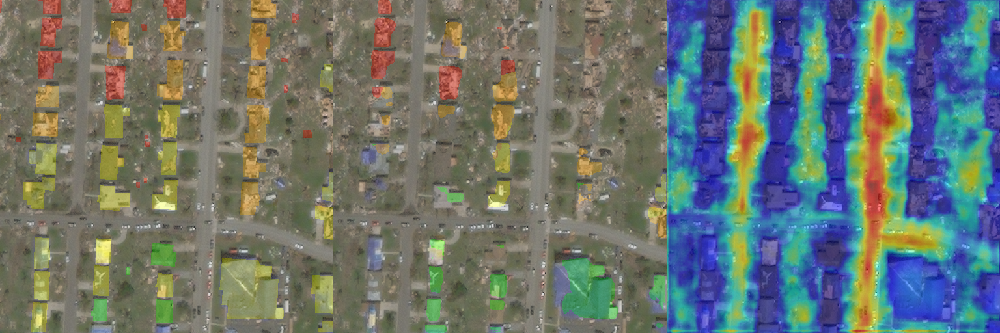

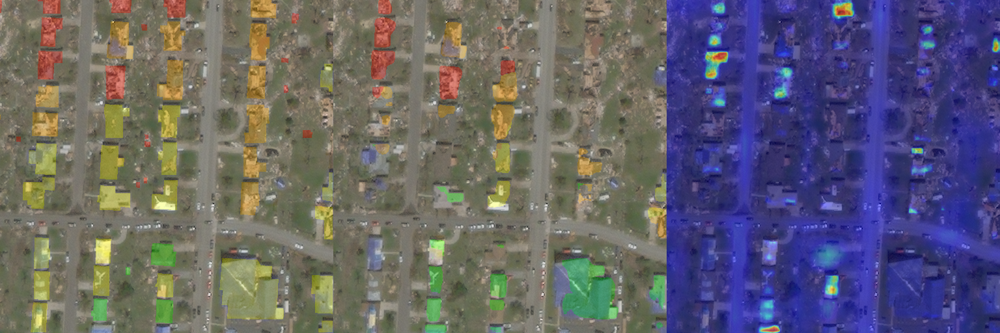

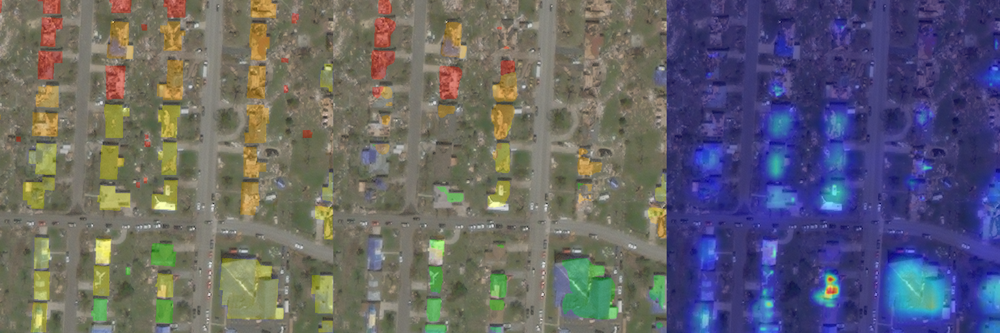

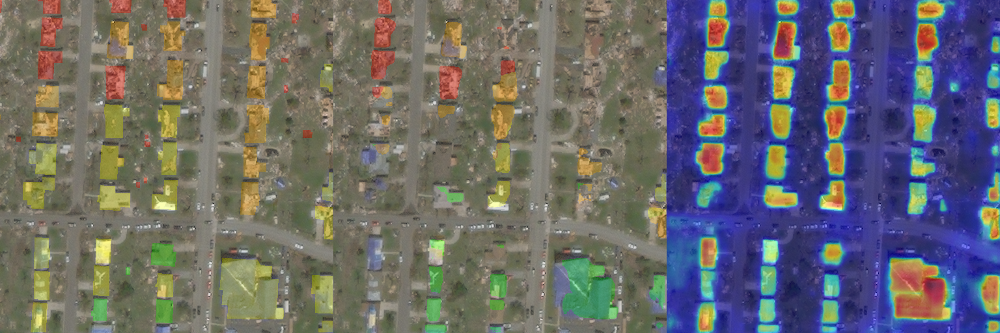

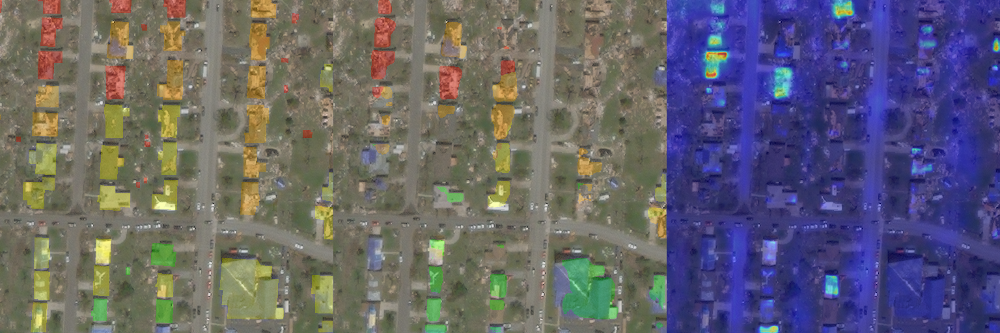

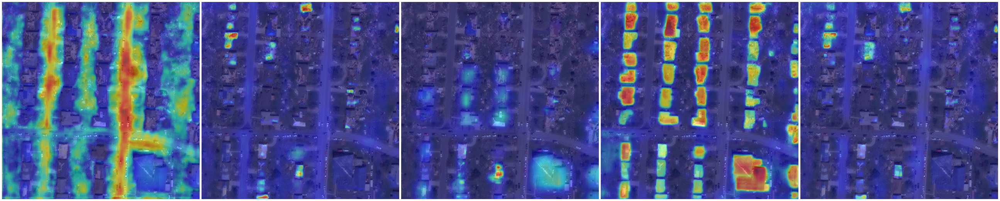

In [13]:
IMG_NAME = "joplin-tornado_00000000_post_disaster_patch3"
# IMG_NAME = "hurricane-harvey_00000030_post_disaster_patch0"

IMG_PATH_POST = Path(f"data/xBD_processed_512/images/tier3/images/{IMG_NAME}.png")

# FarSeg
# target_layers = model.model.module.decoder.blocks

# Baseline
target_layers = [
    model.model.conv6_2,
    model.model.conv7_2,
    model.model.conv8_2,
    model.model.conv9_2,
    model.model.conv10,
    model.model.res,
]

# region boring
item = dm_test._test_dataset[dm_test._test_dataset._image_paths_post.index(IMG_PATH_POST)]
image_pre, mask_pre, image_post, mask_post = item

with torch.no_grad():
    m = model.to(device)
    preds = m(torch.cat([torch.unsqueeze(image_pre, 0), torch.unsqueeze(image_post, 0)], dim=1).to(device))

for c in range(0, 5):
    targets = [SemanticSegmentationTarget(c, mask_post.argmax(axis=0))]
    with GradCAM(
        model=model,
        target_layers=target_layers,
    ) as cam:
        grayscale_cam = cam(
            input_tensor=torch.unsqueeze(torch.cat([image_pre, image_post], dim=0), 0), targets=targets
        )[0, :]
        cam_image = show_cam_on_image(
            ((image_post + 1) / 2).moveaxis(0, -1).detach().cpu().numpy(), grayscale_cam, use_rgb=True
        )

    colors = [
        (128, 128, 128),
        (0, 255, 0),
        (244, 255, 0),
        (255, 174, 0),
        (255, 0, 0),
        (255, 255, 255),
    ]
    preds_masks = draw_segmentation_masks(
        ((image_post + 1) * 127.5).to(torch.uint8),
        torch.nn.functional.one_hot(preds[0].argmax(dim=0), num_classes=5).moveaxis(-1, 0).to(bool),
        colors=colors,
        alpha=0.3,
    )
    ground_truth_masks = draw_segmentation_masks(
        ((image_post + 1) * 127.5).to(torch.uint8), mask_post.to(bool), colors=colors, alpha=0.3
    )
    comp = np.hstack(
        (
            ground_truth_masks.moveaxis(0, -1).detach().cpu().numpy(),
            preds_masks.moveaxis(0, -1).detach().cpu().numpy(),
            cam_image,
        )
    )
    display(Image.fromarray(comp))

acts = []
for c in range(0, 5):
    targets = [SemanticSegmentationTarget(c, mask_post.argmax(axis=0))]
    with GradCAM(
        model=model,
        target_layers=target_layers,
    ) as cam:
        grayscale_cam = cam(
            input_tensor=torch.unsqueeze(torch.cat([image_pre, image_post], dim=0), 0), targets=targets
        )[0, :]
        cam_image = show_cam_on_image(
            ((image_post + 1) / 2).moveaxis(0, -1).detach().cpu().numpy(), grayscale_cam, use_rgb=True
        )

    acts.append(torch.from_numpy(cam_image).moveaxis(-1, 0))
comp_acts = make_grid(torch.stack(acts), padding=5, pad_value=255)
display(Image.fromarray(comp_acts.moveaxis(0, -1).numpy()))

# endregion